# Летний проект

## Тема: Анализ тональности текста
## Задача: Распознование эмоций автора сообщения

In [1]:
import tensorflow as tf
import tensorflow_datasets
import keras
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn
from sklearn.model_selection import train_test_split

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, MaxPooling1D, Dropout, LSTM, Bidirectional, SpatialDropout1D, Flatten, SimpleRNN, GRU, Conv2D, Conv1D, GlobalMaxPooling1D
from tensorflow.keras import utils
from tensorflow.keras.callbacks import ModelCheckpoint


 ## Используется датасет GoEmotions
 
 GoEmotions – это корпус из 58 тысяч размеченных комментариев из Reddit, с аннотацией из 27 категорий эмоций или нейтральные. 
*	Количество примеров: 58,009.
*	Количество категорий: 27 + нейтральная.
*	Максимальная длинна текста 30 символов.
*	Язык: английский.

Категории эмоций включают: _восхищение, веселье, гнев, раздражение, одобрение, забота, замешательство, любопытство, желание, разочарование, неодобрение, отвращение, смущение, волнение, страх, благодарность, горе, радость, любовь, нервозность, оптимизм, гордость, осознание, облегчение, раскаяние, печаль, удивление_.
 ### C помощью Google API его можно скачать следующими командами

In [ ]:
#Windows
#!pip install wget
!python -m wget https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_1.csv -o goemotions_1.csv
!python -m wget https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_2.csv -o goemotions_2.csv
!python -m wget https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_3.csv -o goemotions_3.csv

In [ ]:
#linux(Google Collab)
!wget -P data/full_dataset/ https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_1.csv &> /dev/null
!wget -P data/full_dataset/ https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_2.csv &> /dev/null
!wget -P data/full_dataset/ https://storage.googleapis.com/gresearch/goemotions/data/full_dataset/goemotions_3.csv &> /dev/null

In [ ]:
df1 = pd.read_csv('/content/data/full_dataset/goemotions_1.csv')
df2 = pd.read_csv('/content/data/full_dataset/goemotions_2.csv')
df3 = pd.read_csv('/content/data/full_dataset/goemotions_3.csv')
df = pd.concat([df1, df2, df3], sort=False)
df.drop(['id', 'link_id','parent_id','created_utc','rater_id','example_very_unclear'], axis=1, inplace=True)
df.drop_duplicates(subset=['text', 'author', 'subreddit'], inplace=True)
df.reset_index(inplace=True, drop=True)
df_analysis = df[['text']]
emotions = df.drop(columns=['text','author','subreddit'], axis=1, inplace=False).idxmax(axis=1)
df_analysis.loc[:, 'text_emotion'] = emotions

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value


In [ ]:
df_Emotion_final = pd.read_csv('/content/Emotion_final.csv')
df_text_emotion = pd.read_csv('/content/text_emotion.csv')

In [ ]:
df_text_emotion.drop(['tweet_id', 'author'], axis=1, inplace=True)
#df_text_emotion.drop_duplicates(subset="content", inplace=True)

In [ ]:
df_text_emotion.rename(columns={"sentiment":"text_emotion","content":"text"},inplace=True)
df_text_emotion.groupby("text_emotion").nunique().sort_values(by="text", ascending=False)

In [ ]:
df_text_emotion

In [ ]:
df_Emotion_final.rename(columns={"Text":"text","Emotion":"text_emotion"},inplace=True)

In [ ]:
df_Emotion_final.groupby("text_emotion").nunique().sort_values(by="text", ascending=False)


In [ ]:
df_analysis.describe(include='all')

In [ ]:
df_analysis.groupby("text_emotion").nunique().sort_values(by="text", ascending=False)

In [ ]:
df_analysis


In [ ]:
df_text_emotion = df_text_emotion[["text","text_emotion"]]

In [ ]:
df_text_emotion

In [ ]:
df_2 = df_Emotion_final.append(df_text_emotion, ignore_index=True)


In [ ]:
df_3 = df_analysis.append(df_2, ignore_index=True)

In [ ]:
df_3

In [ ]:
df_3.groupby("text_emotion").nunique().sort_values(by="text", ascending=False)

In [ ]:
df_3.to_csv("extended_emotions.csv")

## Препроцессинг

In [2]:
!pip install ekphrasis
from ekphrasis.classes.preprocessor import TextPreProcessor
from ekphrasis.classes.tokenizer import SocialTokenizer
from ekphrasis.dicts.emoticons import emoticons
# Максимальное количество слов 
num_words = 20000
# Максимальная длина комментария
max_comment_len = 33

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 83 kB 2.7 MB/s 
     |████████████████████████████████| 53 kB 2.1 MB/s 


In [3]:
emoticons_additional = {
	'(^・^)': '<happy>', ':‑c': '<sad>', '=‑d': '<happy>', ":'‑)": '<happy>', ':‑d': '<laugh>',
	':‑(': '<sad>', ';‑)': '<happy>', ':‑)': '<happy>', ':\\/': '<sad>', 'd=<': '<annoyed>',
	':‑/': '<annoyed>', ';‑]': '<happy>', '(^�^)': '<happy>', 'angru': 'angry', "d‑':":
    	'<annoyed>', ":'‑(": '<sad>', ":‑[": '<annoyed>', '(�?�)': '<happy>', 'x‑d': '<laugh>',
      '<3':'<happy>','¯_(ツ)_/¯':'<why> ',
}

In [4]:
text_processor1 = TextPreProcessor(
	# terms that will be normalized
	normalize=['url', 'email', 'percent', 'money', 'phone', 'user',
           	'time', 'url', 'date'],
	# terms that will be annotated
	annotate={"allcaps", "elongated", "repeated",
          	'emphasis', 'censored'},
	fix_html=True,  # fix HTML tokens
	# corpus from which the word statistics are going to be used
	# for word segmentation
	segmenter="twitter",
	# corpus from which the word statistics are going to be used
	# for spell correction
	corrector="twitter",
	unpack_hashtags=True,  # perform word segmentation on hashtags
	unpack_contractions=True,  # Unpack contractions (can't -> can not)
	spell_correct_elong=True,  # spell correction for elongated words
	# select a tokenizer. You can use SocialTokenizer, or pass your own
	# the tokenizer, should take as input a string and return a list of tokens
	tokenizer=SocialTokenizer(lowercase=True).tokenize,
	# list of dictionaries, for replacing tokens extracted from the text,
	# with other expressions. You can pass more than one dictionaries.
	dicts=[emoticons, emoticons_additional]
)
text_processor2 = TextPreProcessor(
    # terms that will be normalized
# terms that will be normalized
	normalize=['url', 'email', 'percent', 'money', 'phone', 'user',
           	'time', 'url', 'date','number'],
	# terms that will be annotated
	annotate={"allcaps", "elongated", "repeated",
          	'emphasis', 'censored'},
	fix_html=True,  # fix HTML tokens
	# corpus from which the word statistics are going to be used
	# for word segmentation
	segmenter="twitter",
	# corpus from which the word statistics are going to be used
	# for spell correction
	corrector="twitter",
	unpack_hashtags=True,  # perform word segmentation on hashtags
	unpack_contractions=True,  # Unpack contractions (can't -> can not)
	spell_correct_elong=True,  # spell correction for elongated words
	# select a tokenizer. You can use SocialTokenizer, or pass your own
	# the tokenizer, should take as input a string and return a list of tokens
	tokenizer=SocialTokenizer(lowercase=True).tokenize,
	# list of dictionaries, for replacing tokens extracted from the text,
	# with other expressions. You can pass more than one dictionaries.
	dicts=[emoticons, emoticons_additional]
)

/usr/local/lib/python3.7/dist-packages/ekphrasis/classes/tokenizer.py:225: FutureWarning: Possible nested set at position 2190
  self.tok = re.compile(r"({})".format("|".join(pipeline)))


Word statistics files not found!
Downloading... done!
Unpacking... done!
Reading twitter - 1grams ...
generating cache file for faster loading...
reading ngrams /root/.ekphrasis/stats/twitter/counts_1grams.txt
Reading twitter - 2grams ...
generating cache file for faster loading...
reading ngrams /root/.ekphrasis/stats/twitter/counts_2grams.txt


/usr/local/lib/python3.7/dist-packages/ekphrasis/classes/exmanager.py:14: FutureWarning: Possible nested set at position 42
  regexes = {k.lower(): re.compile(self.expressions[k]) for k, v in


Reading twitter - 1grams ...
Reading twitter - 1grams ...
Reading twitter - 2grams ...
Reading twitter - 1grams ...


In [5]:
def tokenize(text):
    text1 = " ".join(text_processor1.pre_process_doc(text))
    text2 = " ".join(text_processor2.pre_process_doc(text1))
    return text2

In [ ]:
df = pd.read_csv('/content/extended_emotions.csv')

In [ ]:
df

,Unnamed: 0,text,text_emotion
0,0,That game hurt.,sadness
1,1,>sexuality shouldn’t be a grouping category I...,admiration
2,2,"You do right, if you don't care then fuck 'em!",neutral
3,3,Man I love reddit.,love
4,4,"[NAME] was nowhere near them, he was by the Fa...",neutral
...,...,...,...
119463,119463,@JohnLloydTaylor,neutral
119464,119464,Happy Mothers Day All my love,love
119465,119465,Happy Mother's Day to all the mommies out ther...,love
119466,119466,@niariley WASSUP BEAUTIFUL!!! FOLLOW ME!! PEE...,happiness


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [16]:
!pip install emojis
import re
import emojis
texts = []
for s in df.text:
  text = tokenize(s)
  text = re.sub('[/<>]', '', text)
  text = emojis.decode(text)
  texts.append(text)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


NameError: ignored

## Эмбеддинг

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, MaxPooling1D, Dropout, LSTM, Bidirectional, SpatialDropout1D
from tensorflow.keras import utils
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import utils
from google.colab import files

In [ ]:
tokenizer = Tokenizer(num_words=num_words, filters='{|}~[]\t\n')
tokenizer.fit_on_texts(texts)
sequences = tokenizer.texts_to_sequences(texts)
x_train = pad_sequences(sequences, maxlen=max_comment_len)

In [ ]:
y_train = pd.get_dummies(df['text_emotion'])
train_labels = df.text_emotion.values

### Сеть biLSTM

In [ ]:
def build_biderectional_rnn_model(num_words, input_length, keras_layer):
  model_rnn = Sequential()
  model_rnn.add(Embedding(num_words, 200, input_length=input_length))
  model_rnn.add(SpatialDropout1D(0.6))
  model_rnn.add(Bidirectional(keras_layer(100, return_sequences=True)))
  model_rnn.add(SpatialDropout1D(0.6))
  model_rnn.add(Bidirectional(keras_layer(60)))
  model_rnn.add(Dense(len(np.unique(train_labels)),activation='sigmoid'))
    
  model_rnn.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.001),
                loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=["accuracy",tf.keras.metrics.AUC(),tf.keras.metrics.Precision(),
                        tf.keras.metrics.Recall(),tf.keras.metrics.TruePositives(),
                        tf.keras.metrics.TrueNegatives(),tf.keras.metrics.FalsePositives(),
                        tf.keras.metrics.FalseNegatives()])
  return model_rnn
model_rnn = build_biderectional_rnn_model(num_words=num_words, input_length=max_comment_len, keras_layer=LSTM)

In [ ]:
model_rnn_save_path = 'best_model_rnn.h5'
checkpoint_callback_rnn= ModelCheckpoint(model_rnn_save_path,
                                            monitor="val_loss",
                                           save_best_only=True,
                                           verbose=1)

In [ ]:
model_rnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 33, 200)           4000000   
                                                                 
 spatial_dropout1d (SpatialD  (None, 33, 200)          0         
 ropout1D)                                                       
                                                                 
 bidirectional (Bidirectiona  (None, 33, 200)          240800    
 l)                                                              
                                                                 
 spatial_dropout1d_1 (Spatia  (None, 33, 200)          0         
 lDropout1D)                                                     
                                                                 
 bidirectional_1 (Bidirectio  (None, 120)              125280    
 nal)                                                   

In [ ]:
history_rnn = model_rnn.fit(x_train, 
                              y_train, 
                              epochs=15,
                              batch_size=52,
                              validation_split=0.1,
                              callbacks=[checkpoint_callback_rnn])

Epoch 1/15
2065/2068 [============================>.] - ETA: 0s - loss: 0.1080 - accuracy: 0.2361 - auc: 0.8139 - precision: 0.0217 - recall: 5.6808e-04 - true_positives: 61.0000 - true_negatives: 3755552.0000 - false_positives: 2748.0000 - false_negatives: 107319.0000
Epoch 1: val_loss improved from inf to 0.10496, saving model to best_model_rnn.h5
2068/2068 [==============================] - 53s 19ms/step - loss: 0.1080 - accuracy: 0.2361 - auc: 0.8140 - precision: 0.0217 - recall: 5.6733e-04 - true_positives: 61.0000 - true_negatives: 3760487.0000 - false_positives: 2748.0000 - false_negatives: 107460.0000 - val_loss: 0.1050 - val_accuracy: 0.2057 - val_auc: 0.8390 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_true_positives: 0.0000e+00 - val_true_negatives: 418145.0000 - val_false_positives: 0.0000e+00 - val_false_negatives: 11947.0000
Epoch 2/15
2067/2068 [============================>.] - ETA: 0s - loss: 0.0928 - accuracy: 0.3063 - auc: 0.8811 - precision: 0.6689 - r

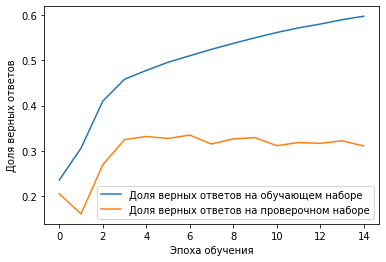

In [ ]:
plt.plot(history_rnn.history['accuracy'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(history_rnn.history['val_accuracy'], 
         label='Доля верных ответов на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [ ]:
best_model_rnn = keras.models.load_model('/content/best_model_rnn.h5')

##### Визуализация Эмбеддинга

In [ ]:
embedding_matrix = model_rnn.layers[0].get_weights()[0]

In [ ]:
import numpy as np
from sklearn.manifold import TSNE

X = list(embedding_matrix)

X_embedded = TSNE(n_components=2).fit_transform(X)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [ ]:
emotions_label = []
for arr in embedding_matrix:
  emotions_label.append(emotions[arr.argmax()])

In [ ]:
df_embeddings = pd.DataFrame(X_embedded)
df_embeddings = df_embeddings.rename(columns={0:'x',1:'y'})
df_embeddings = df_embeddings.assign(label=emotions_label)
df_embeddings = df_embeddings.assign(text=list(tokenizer.word_index.items())[:num_words])

In [ ]:
import plotly.express as px

fig = px.scatter(
    df_embeddings, x='x', y='y',
    color='label', labels={'color': 'label'},
    hover_data=['text'], title = 'GoEmotions Embedding Visualization')
fig.show()

## 6 эмоций

In [6]:
df_6 = pd.read_csv('/content/extended_emotions.csv')

In [ ]:
df

In [7]:
df_6.loc[(df_6["text_emotion"] == "neutral") | (df_6["text_emotion"] =="boredom"), "text_emotion"] = "neutral"

In [8]:
df_6.loc[(df_6["text_emotion"] == "sadness") | (df_6["text_emotion"] == "grief") | (df_6["text_emotion"] == "remorse") |
      (df_6["text_emotion"] == "empty"), "text_emotion"] = "sad"

In [9]:
df_6.loc[(df_6["text_emotion"] == "worry") | (df_6["text_emotion"] == "fear") | (df_6["text_emotion"] == "nervousness"), "text_emotion"] = "fear"

In [10]:
df_6.loc[(df_6["text_emotion"] == "happy") | (df_6["text_emotion"] == "love") | (df_6["text_emotion"] == "admiration") |
      (df_6["text_emotion"] == "happiness") | (df_6["text_emotion"] == "approval") | (df_6["text_emotion"] ==  "gratitude") |
      (df_6["text_emotion"] == "amusement") | (df_6["text_emotion"] == "curiosity") | (df_6["text_emotion"] == "fun") |
      (df_6["text_emotion"] == "relief") | (df_6["text_emotion"] == "joy") | (df_6["text_emotion"] == "optimism") | 
      (df_6["text_emotion"] == "caring") | (df_6["text_emotion"] ==  "desire") | (df_6["text_emotion"] == "enthusiasm") | 
      (df_6["text_emotion"] == "pride"), "text_emotion"] = "happy"

In [11]:
df_6.loc[(df_6["text_emotion"] == "anger") | (df_6["text_emotion"] == "annoyance") | (df_6["text_emotion"] == "hate") |
      (df_6["text_emotion"] == "embarrassment"), "text_emotion"] = "anger"

In [12]:
df_6.loc[(df_6["text_emotion"] == "disapproval") | (df_6["text_emotion"] == "disappointment") | (df_6["text_emotion"] == "disgust"), "text_emotion"] = "disgust"

In [13]:
df_6.loc[(df_6["text_emotion"] == "confusion") | (df_6["text_emotion"] == "surprise") | (df_6["text_emotion"] == "realization") |
      (df_6["text_emotion"] == "excitement"), "text_emotion"] = "surprise"

In [ ]:
df_plot_6 = df_6.groupby("text_emotion").nunique().sort_values(by="text", ascending=False)

In [ ]:
df_plot = df.groupby("text_emotion").nunique().sort_values(by="text", ascending=False)

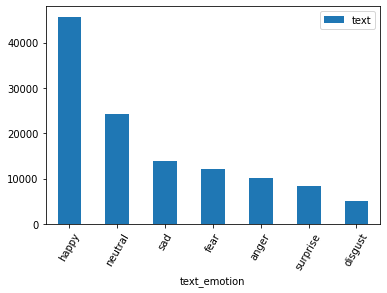

In [ ]:
df_plot_6.plot.bar( y='text', rot=60)

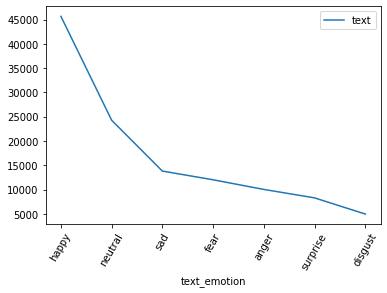

In [ ]:
df_plot_6.plot( y='text', rot=60)

In [17]:
import re
texts = []
for s in df_6.text:
  text = tokenize(s)
  text = re.sub('[/<>]', '', text)
  text = emojis.decode(text)
  texts.append(text)

## Эмбеддинг

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, MaxPooling1D, Dropout, LSTM, Bidirectional, SpatialDropout1D
from tensorflow.keras import utils
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import utils
from google.colab import files

In [ ]:
tokenizer = Tokenizer(num_words=num_words, filters='{|}~[]\t\n')
tokenizer.fit_on_texts(texts)
sequences = tokenizer.texts_to_sequences(texts)
x_train = pad_sequences(sequences, maxlen=max_comment_len)

In [ ]:
y_train = pd.get_dummies(df_6['text_emotion'])
train_labels = df_6.text_emotion.values

### Сеть biLSTM

In [ ]:
def build_biderectional_rnn_model(num_words, input_length, keras_layer):
  model_rnn = Sequential()
  model_rnn.add(Embedding(num_words, len(np.unique(train_labels)), input_length=input_length))
  model_rnn.add(SpatialDropout1D(0.6))
  model_rnn.add(Bidirectional(keras_layer(100, return_sequences=True)))
  model_rnn.add(SpatialDropout1D(0.6))
  model_rnn.add(Bidirectional(keras_layer(60)))
  model_rnn.add(Dense(len(np.unique(train_labels)),activation='sigmoid'))
    
  model_rnn.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.001),
                loss=tf.keras.losses.BinaryCrossentropy(),
                metrics=["accuracy",tf.keras.metrics.AUC(),tf.keras.metrics.Precision(),
                        tf.keras.metrics.Recall(),tf.keras.metrics.TruePositives(),
                        tf.keras.metrics.TrueNegatives(),tf.keras.metrics.FalsePositives(),
                        tf.keras.metrics.FalseNegatives()])
  return model_rnn
model_rnn = build_biderectional_rnn_model(num_words=num_words, input_length=max_comment_len, keras_layer=LSTM)

In [ ]:
model_rnn_save_path = 'best_model_rnn.h5'
checkpoint_callback_rnn= ModelCheckpoint(model_rnn_save_path,
                                            monitor="val_loss",
                                           save_best_only=True,
                                           verbose=1)

In [ ]:
model_rnn.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, 33, 7)             140000    
                                                                 
 spatial_dropout1d_6 (Spatia  (None, 33, 7)            0         
 lDropout1D)                                                     
                                                                 
 bidirectional_6 (Bidirectio  (None, 33, 200)          86400     
 nal)                                                            
                                                                 
 spatial_dropout1d_7 (Spatia  (None, 33, 200)          0         
 lDropout1D)                                                     
                                                                 
 bidirectional_7 (Bidirectio  (None, 120)              125280    
 nal)                                                 

In [ ]:
history_rnn = model_rnn.fit(x_train, 
                              y_train, 
                              epochs=10,
                              batch_size=52,
                              validation_split=0.1,
                              callbacks=[checkpoint_callback_rnn])

Epoch 1/10
2067/2068 [============================>.] - ETA: 0s - loss: 0.2711 - accuracy: 0.5552 - auc_3: 0.8722 - precision_3: 0.7664 - recall_3: 0.3593 - true_positives_3: 38622.0000 - true_negatives_3: 633129.0000 - false_positives_3: 11775.0000 - false_negatives_3: 68862.0000
Epoch 1: val_loss did not improve from 0.29548
2068/2068 [==============================] - 34s 16ms/step - loss: 0.2711 - accuracy: 0.5552 - auc_3: 0.8722 - precision_3: 0.7664 - recall_3: 0.3594 - true_positives_3: 38638.0000 - true_negatives_3: 633348.0000 - false_positives_3: 11778.0000 - false_negatives_3: 68883.0000 - val_loss: 0.2959 - val_accuracy: 0.5429 - val_auc_3: 0.8512 - val_precision_3: 0.6803 - val_recall_3: 0.3511 - val_true_positives_3: 4195.0000 - val_true_negatives_3: 69711.0000 - val_false_positives_3: 1971.0000 - val_false_negatives_3: 7752.0000
Epoch 2/10
2068/2068 [==============================] - ETA: 0s - loss: 0.2690 - accuracy: 0.5604 - auc_3: 0.8744 - precision_3: 0.7660 - recall

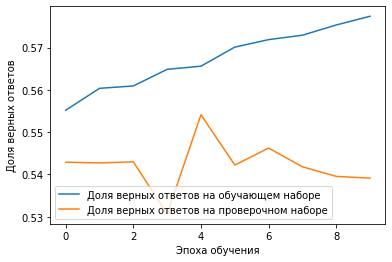

In [ ]:
plt.plot(history_rnn.history['accuracy'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(history_rnn.history['val_accuracy'], 
         label='Доля верных ответов на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

In [ ]:
best_model_rnn = keras.models.load_model('/content/best_model_rnn.h5')

##### Визуализация Эмбеддинга

In [ ]:
embedding_matrix = model_rnn.layers[0].get_weights()[0]

In [ ]:
import numpy as np
from sklearn.manifold import TSNE

X = list(embedding_matrix)

X_embedded = TSNE(n_components=2).fit_transform(X)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



In [ ]:
emotions = df_6.text_emotion
emotions_label = []
for arr in embedding_matrix:
  emotions_label.append(emotions[arr.argmax()])

In [ ]:
emotions.unique()

array(['sad', 'happy', 'neutral', 'disgust', 'surprise', 'anger', 'fear'],
      dtype=object)

In [ ]:
df_embeddings = pd.DataFrame(X_embedded)
df_embeddings = df_embeddings.rename(columns={0:'x',1:'y'})
df_embeddings = df_embeddings.assign(label=emotions_label)
df_embeddings = df_embeddings.assign(text=list(tokenizer.word_index.items())[:num_words])

In [ ]:
import plotly.express as px

fig = px.scatter(
    df_embeddings, x='x', y='y',
    color='label', labels={'color': 'label'},
    hover_data=['text'], title = 'GoEmotions Embedding Visualization')
fig.show()

## Bert
Используется "легкая" модель “bert_en_uncased_L-12_H-768_A-12“.

- L-12 : 12 скрытых слоев
- H-768 : 768 нейронов (размерность скрытого слоя)
- A-12 : 12 модулей внимания

In [18]:
import tensorflow_hub as hub

module_url = "https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/1"

bert_layer = hub.KerasLayer(module_url, trainable=True)

In [19]:
!pip install bert-tensorflow &> /dev/null
!pip install sentencepiece &> /dev/null

In [20]:
from bert import tokenization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from keras.layers import Input
# The 4 next lines allows to prevent an error due to Bert version
import sys
from absl import flags
sys.argv=['preserve_unused_tokens=False']
flags.FLAGS(sys.argv)
max_comment_len = 37
max_len = max_comment_len + 2

def bert_encode(texts, tokenizer, max_len=512):
    all_tokens = []
    all_masks = []
    all_segments = []
    
    for text in texts:
        text = tokenizer.tokenize(text)
        
        text = text[:max_len-2]
        input_sequence = ["[CLS]"] + text + ["[SEP]"]
        pad_len = max_len - len(input_sequence)
        
        tokens = tokenizer.convert_tokens_to_ids(input_sequence)
        tokens += [0] * pad_len
        pad_masks = [1] * len(input_sequence) + [0] * pad_len
        segment_ids = [0] * max_len
        
        all_tokens.append(tokens)
        all_masks.append(pad_masks)
        all_segments.append(segment_ids)
    
    return np.array(all_tokens), np.array(all_masks), np.array(all_segments)

vocab_file = bert_layer.resolved_object.vocab_file.asset_path.numpy()

do_lower_case = bert_layer.resolved_object.do_lower_case.numpy()

tokenizer = tokenization.FullTokenizer(vocab_file, do_lower_case)

In [ ]:
!pip install emojis
import re
import emojis
texts = []
for s in df_6.text:
  text = tokenize(s)
  text = re.sub('[/<>]', '', text)
  text = emojis.decode(text)
  texts.append(text)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [21]:
max_len = max_comment_len + 4
prep_texts = texts
train_labels = df_6.text_emotion.values
y = pd.get_dummies(train_labels)

# деление на тренировоную и тестовую выборку
prep_X_train, prep_X_test, Y_train, Y_test = train_test_split(prep_texts, y, test_size=0.1, random_state=42)
prep_train_input = bert_encode(prep_X_train, tokenizer, max_len=max_len)
prep_test_input = bert_encode(prep_X_test, tokenizer, max_len=max_len)

In [ ]:
def build_model(bert_layer, max_len=512):
    input_word_ids = Input(shape=(max_len,), dtype=tf.int32, name="input_word_ids")
    input_mask = Input(shape=(max_len,), dtype=tf.int32, name="input_mask")
    segment_ids = Input(shape=(max_len,), dtype=tf.int32, name="segment_ids")

    _, sequence_output = bert_layer([input_word_ids, input_mask, segment_ids])
    clf_output = sequence_output[:, 0, :]

    flatten = Flatten(name='flatten')
    output_flatten = flatten(clf_output)

    out = Dense(len(np.unique(train_labels)), activation='sigmoid')(output_flatten)
    
    model = Model(inputs=[input_word_ids, input_mask, segment_ids], outputs=out)
    model.compile(Adam(learning_rate=0.000001), loss='binary_crossentropy', metrics=["accuracy",tf.keras.metrics.AUC(),tf.keras.metrics.Precision(),tf.keras.metrics.Recall(),tf.keras.metrics.TruePositives(thresholds=None, name=None, dtype=None),
                            tf.keras.metrics.TrueNegatives(thresholds=None, name=None, dtype=None),tf.keras.metrics.FalsePositives(thresholds=None, name=None, dtype=None),
                            tf.keras.metrics.FalseNegatives(thresholds=None, name=None, dtype=None)])
    
    return model

model = build_model(bert_layer, max_len=max_len)

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_word_ids (InputLayer)    [(None, 41)]         0           []                               
                                                                                                  
 input_mask (InputLayer)        [(None, 41)]         0           []                               
                                                                                                  
 segment_ids (InputLayer)       [(None, 41)]         0           []                               
                                                                                                  
 keras_layer (KerasLayer)       [(None, 768),        109482241   ['input_word_ids[0][0]',         
                                 (None, 41, 768)]                 'input_mask[0][0]',         

In [ ]:
model_bert_save_path = 'best_model_bert.h5'
checkpoint_callback_bert = ModelCheckpoint(model_bert_save_path,
                                            monitor="val_loss",
                                           save_best_only=True,
                                           verbose=1)

In [ ]:
train_history = model.fit(
    prep_train_input, Y_train,
    validation_split=0.1,
    epochs=12,
    batch_size=32,
    callbacks=[checkpoint_callback_bert]
)

Epoch 1/12
3024/3024 [==============================] - ETA: 0s - loss: 0.3097 - accuracy: 0.4898 - auc_4: 0.8308 - precision_4: 0.6609 - recall_4: 0.2779 - true_positives_4: 26893.0000 - true_negatives_4: 566807.0000 - false_positives_4: 13801.0000 - false_negatives_4: 69875.0000
Epoch 1: val_loss improved from inf to 0.27883, saving model to best_model_bert.h5
3024/3024 [==============================] - 904s 294ms/step - loss: 0.3097 - accuracy: 0.4898 - auc_4: 0.8308 - precision_4: 0.6609 - recall_4: 0.2779 - true_positives_4: 26893.0000 - true_negatives_4: 566807.0000 - false_positives_4: 13801.0000 - false_negatives_4: 69875.0000 - val_loss: 0.2788 - val_accuracy: 0.5443 - val_auc_4: 0.8717 - val_precision_4: 0.7203 - val_recall_4: 0.3425 - val_true_positives_4: 3683.0000 - val_true_negatives_4: 63088.0000 - val_false_positives_4: 1430.0000 - val_false_negatives_4: 7070.0000
Epoch 2/12
3024/3024 [==============================] - ETA: 0s - loss: 0.2668 - accuracy: 0.5670 - auc_4:

#### Оценка результатов

In [ ]:
plt.plot(train_history.history['accuracy'], 
         label='Доля верных ответов на обучающем наборе')
plt.plot(train_history.history['val_accuracy'], 
         label='Доля верных ответов на проверочном наборе')
plt.xlabel('Эпоха обучения')
plt.ylabel('Доля верных ответов')
plt.legend()
plt.show()

NameError: ignored

In [22]:
best_model_bert = keras.models.load_model('/content/drive/MyDrive/Colab Notebooks/best_model_bert.h5',  custom_objects={'KerasLayer':hub.KerasLayer})

In [23]:
best_model_bert.evaluate(prep_test_input, Y_test)

374/374 [==============================] - 43s 92ms/step - loss: 0.2468 - accuracy: 0.5919 - auc: 0.9011 - precision: 0.7353 - recall: 0.4548 - true_positives: 5433.0000 - true_negatives: 69726.0000 - false_positives: 1956.0000 - false_negatives: 6514.0000


[0.2468319684267044,
 0.5918640494346619,
 0.9010783433914185,
 0.7352821826934814,
 0.45475852489471436,
 5433.0,
 69726.0,
 1956.0,
 6514.0]

##### Визуализация результатов

In [24]:
x = texts

intermediate_layer_model = Model(inputs=best_model_bert.input,
                                 outputs=best_model_bert.get_layer('flatten').output)
input = bert_encode(x, tokenizer, max_len=max_len)
sentence_embedded = intermediate_layer_model.predict(input)

In [25]:
import numpy as np
from sklearn.manifold import TSNE

X = list(sentence_embedded)

X_embedded = TSNE(n_components=2).fit_transform(X)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


In [26]:
df_embeddings = pd.DataFrame(X_embedded)
df_embeddings = df_embeddings.rename(columns={0:'x',1:'y'})
df_embeddings = df_embeddings.assign(label=df_6.text_emotion.values)
df_embeddings = df_embeddings.assign(text=df_6.text.values)

In [27]:
import plotly.express as px

fig = px.scatter(
    df_embeddings, x='x', y='y',
    color='label', labels={'color': 'label'},
    hover_data=['text'], title = 'GoEmotions Embedding Visualization')
fig.show()